<a href="https://colab.research.google.com/github/defneuras/Cloud-detection-in-the-Arctic/blob/main/Brightness_Based_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import os

from google.colab import drive
drive.mount('/content/drive')

import matplotlib.pyplot as plt


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


100%|██████████| 11/11 [00:01<00:00,  5.62it/s]


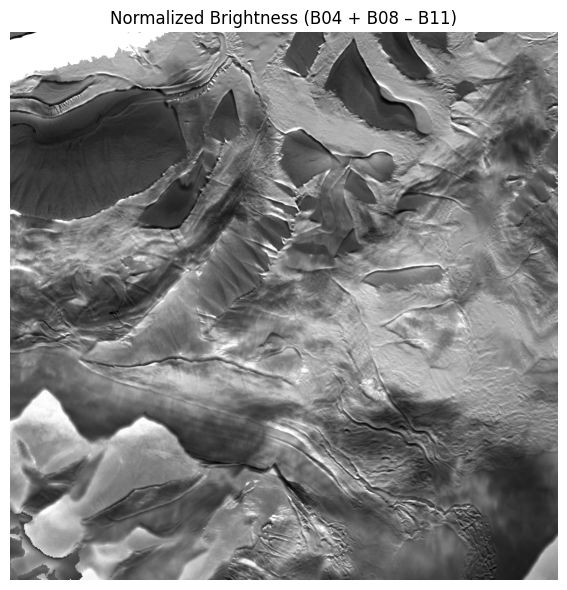

In [ ]:
import numpy as np
import os
from tqdm import tqdm
import matplotlib.pyplot as plt

# === Tile to process
tile_id = "S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536"
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"
features = np.load(f"{val_dir}/{tile_id}_features.npy") / 10000.0

# === Prepare
H, W, _ = features.shape
chunk_size = 1024
brightness = np.zeros((H, W), dtype=np.float32)

# === Process in chunks
for row in tqdm(range(0, H, chunk_size)):
    for col in range(0, W, chunk_size):
        r1, r2 = row, min(row + chunk_size, H)
        c1, c2 = col, min(col + chunk_size, W)

        chunk = features[r1:r2, c1:c2, :]
        B04 = chunk[..., 3]
        B08 = chunk[..., 4]
        B11 = chunk[..., 5]

        chunk_brightness = B04 + B08 - B11
        brightness[r1:r2, c1:c2] = chunk_brightness

# === Normalize for visualization
norm_brightness = np.clip((brightness - np.percentile(brightness, 2)) /
                          (np.percentile(brightness, 98) - np.percentile(brightness, 2)), 0, 1)

# === Save full brightness map
np.save(f"{val_dir}/{tile_id}_brightness.npy", brightness)

# === Preview central crop
h0, w0 = H // 2, W // 2
crop = slice(h0 - 512, h0 + 512), slice(w0 - 512, w0 + 512)

plt.figure(figsize=(6,6))
plt.imshow(norm_brightness[crop], cmap="gray")
plt.title("Normalized Brightness (B04 + B08 – B11)")
plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# === Tile setup
tile_id = "S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536"
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"

# === Load inputs
brightness = np.load(f"{val_dir}/{tile_id}_brightness.npy")
scl = np.load(f"{val_dir}/{tile_id}_scl.npy")
features = np.load(f"{val_dir}/{tile_id}_features.npy") / 10000.0  # scaled

# === Define crop window
H, W = scl.shape
h0, w0 = H // 2, W // 2
crop = slice(h0 - 512, h0 + 512), slice(w0 - 512, w0 + 512)

# === Prepare cropped RGB composite
B02 = features[..., 0][crop]
B11 = features[..., 4][crop]
B12 = features[..., 5][crop]
rgb_crop = np.stack([
    np.clip((B12 - np.percentile(B12, 2)) / (np.percentile(B12, 98) - np.percentile(B12, 2)), 0, 1),
    np.clip((B11 - np.percentile(B11, 2)) / (np.percentile(B11, 98) - np.percentile(B11, 2)), 0, 1),
    np.clip((B02 - np.percentile(B02, 2)) / (np.percentile(B02, 98) - np.percentile(B02, 2)), 0, 1)
], axis=-1)

# === SCL cloud mask (classes 8, 9, 10)
scl_mask = np.isin(scl[crop], [8, 9, 10]).astype(np.uint8)

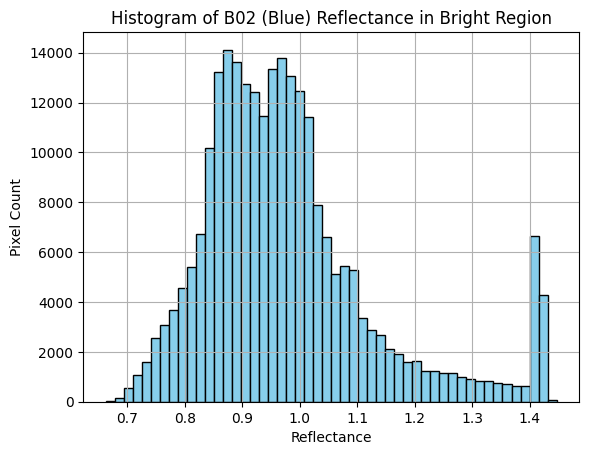

Min: 0.6628
Max: 1.4464
Mean: 0.9801


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

tile_id = "S2B_MSIL2A_20250307T172059_N0511_R012_T17WPV_20250307T212220"
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"

features = np.load(f"{val_dir}/{tile_id}_features.npy") / 10000.0
B02 = features[..., 0]  # Blue band

# === Define a crop where the blue cloud is clearly visible
H, W = B02.shape
h0, w0 = H // 2, W // 2
roi = B02[h0-400:h0+100, w0-600:w0-100]  # Adjust this as needed based on visuals

# === Plot histogram
plt.hist(roi.flatten(), bins=50, color='skyblue', edgecolor='black')
plt.title("Histogram of B02 (Blue) Reflectance in Bright Region")
plt.xlabel("Reflectance")
plt.ylabel("Pixel Count")
plt.grid(True)
plt.show()

# === Print stats
print(f"Min: {roi.min():.4f}")
print(f"Max: {roi.max():.4f}")
print(f"Mean: {roi.mean():.4f}")

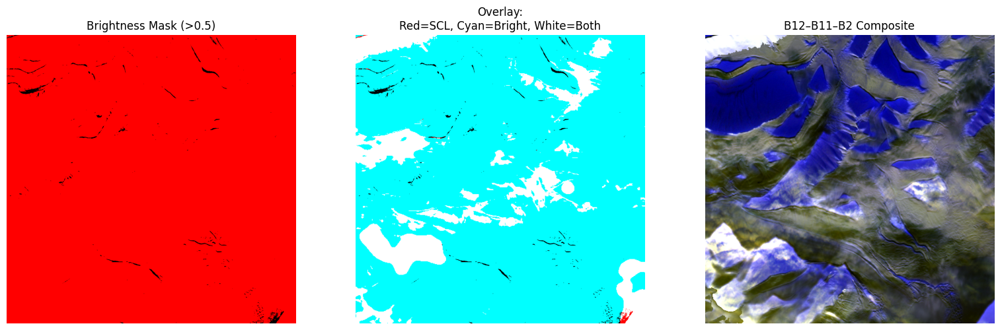

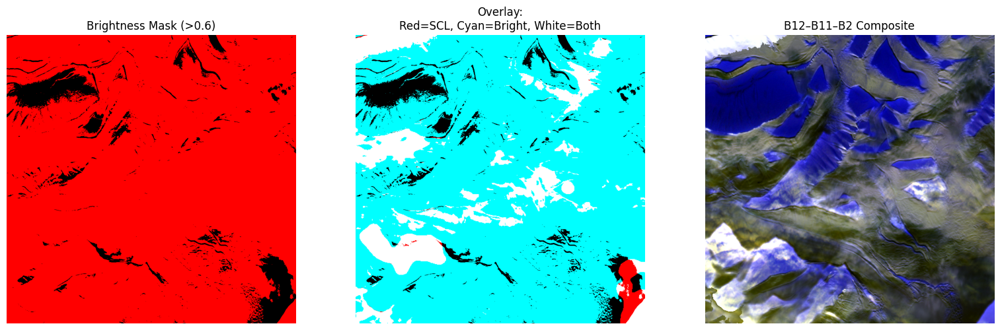

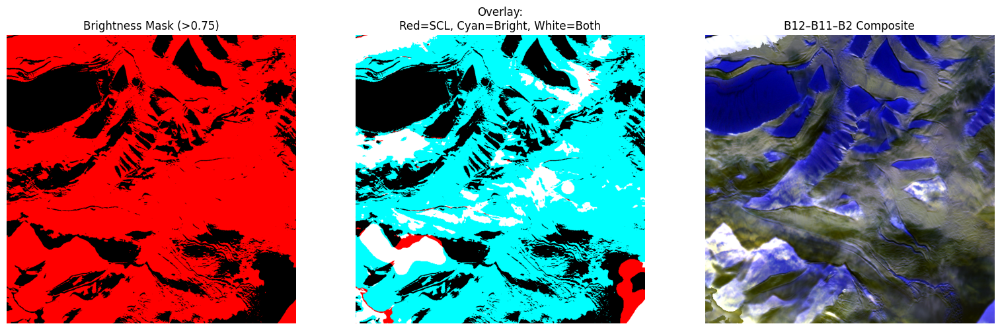

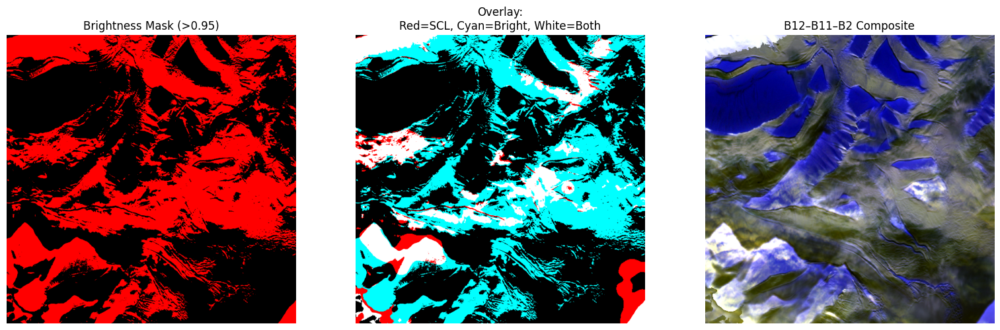

In [ ]:
thresholds = [0.5, 0.6, 0.75, 0.95]

for t in thresholds:
    bright_mask = (brightness[crop] > t).astype(np.uint8)
    overlay = scl_mask + 2 * bright_mask  # 1=SCL, 2=bright, 3=both

    fig, axs = plt.subplots(1, 3, figsize=(16, 5))
    axs[0].imshow(bright_mask, cmap=ListedColormap(['black', 'red']))
    axs[0].set_title(f"Brightness Mask (>{t})")
    axs[1].imshow(overlay, cmap=ListedColormap(['black', 'red', 'cyan', 'white']))
    axs[1].set_title("Overlay:\nRed=SCL, Cyan=Bright, White=Both")
    axs[2].imshow(rgb_crop)
    axs[2].set_title("B12–B11–B2 Composite")
    for ax in axs: ax.axis('off')
    plt.tight_layout()
    plt.show()

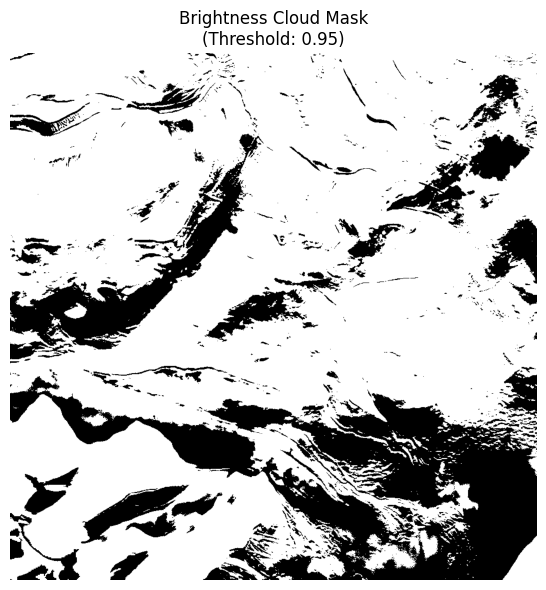

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# === Tile to process
tile_id = "S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536"
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"
features = np.load(f"{val_dir}/{tile_id}_features.npy") / 10000.0

# === Load brightness (previously saved)
brightness = np.load(f"{val_dir}/{tile_id}_brightness.npy")

# === Step 1: Threshold (can adjust later)
threshold = 0.95
B02 = features[..., 0]
cloud_mask = ((brightness > threshold) | (B02 > 0.9)).astype(np.uint8) * 8  # 8 = cloud

# === Save and visualize
np.save(f"{val_dir}/{tile_id}_cloudmask_brightness_thresh.npy", cloud_mask)

# === Crop center for visualization
h0, w0 = brightness.shape[0] // 2, brightness.shape[1] // 2
crop = slice(h0 - 512, h0 + 512), slice(w0 - 512, w0 + 512)

plt.figure(figsize=(6, 6))
plt.imshow(cloud_mask[crop], cmap='gray')
plt.title(f"Brightness Cloud Mask\n(Threshold: {threshold})")
plt.axis('off')
plt.tight_layout()
plt.show()

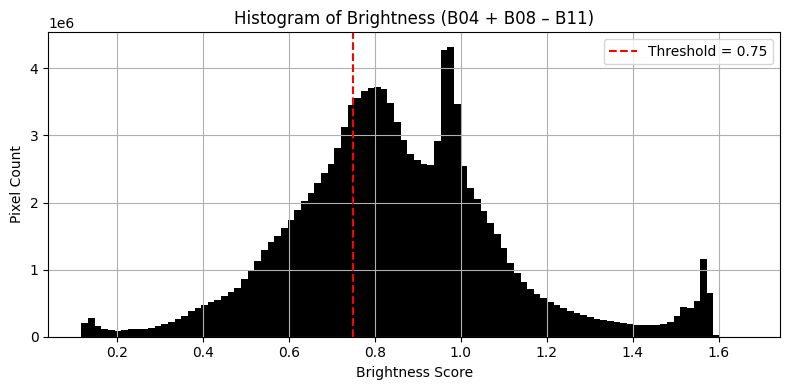

In [ ]:
plt.figure(figsize=(8, 4))
plt.hist(brightness.flatten(), bins=100, color='black')
plt.axvline(threshold, color='red', linestyle='--', label=f"Threshold = {threshold}")
plt.title("Histogram of Brightness (B04 + B08 – B11)")
plt.xlabel("Brightness Score")
plt.ylabel("Pixel Count")
plt.grid(True)
plt.legend()
plt.tight_layout()
plt.show()

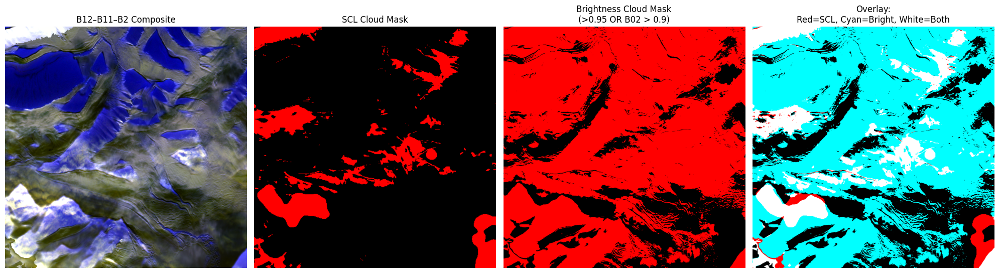

In [ ]:
3import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

# === Tile setup
tile_id = "S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536"
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"

# === Load inputs
scl = np.load(f"{val_dir}/{tile_id}_scl.npy")
features = np.load(f"{val_dir}/{tile_id}_features.npy") / 10000.0
brightness = np.load(f"{val_dir}/{tile_id}_brightness.npy")

# === Define thresholds
threshold = 0.95
B02 = features[..., 0]
cloud_mask = ((brightness > threshold) | (B02 > 0.9)).astype(np.uint8) * 8  # 8 = cloud

# === Crop center
H, W = scl.shape
h0, w0 = H // 2, W // 2
crop = slice(h0 - 512, h0 + 512), slice(w0 - 512, w0 + 512)

# === Extract RGB composite
B02_crop = features[..., 0][crop]
B11_crop = features[..., 4][crop]
B12_crop = features[..., 5][crop]
rgb_crop = np.stack([
    np.clip((B12_crop - np.percentile(B12_crop, 2)) / (np.percentile(B12_crop, 98) - np.percentile(B12_crop, 2)), 0, 1),
    np.clip((B11_crop - np.percentile(B11_crop, 2)) / (np.percentile(B11_crop, 98) - np.percentile(B11_crop, 2)), 0, 1),
    np.clip((B02_crop - np.percentile(B02_crop, 2)) / (np.percentile(B02_crop, 98) - np.percentile(B02_crop, 2)), 0, 1)
], axis=-1)

# === Extract masks
scl_crop = scl[crop]
cloud_mask_crop = cloud_mask[crop]
scl_mask = np.isin(scl_crop, [8, 9, 10]).astype(np.uint8)
bright_mask = (cloud_mask_crop == 8).astype(np.uint8)
overlay = scl_mask + 2 * bright_mask  # 1 = SCL only, 2 = Bright only, 3 = Both

# === Plot
fig, axs = plt.subplots(1, 4, figsize=(20, 6))
axs[0].imshow(rgb_crop); axs[0].set_title("B12–B11–B2 Composite")
axs[1].imshow(scl_mask, cmap=ListedColormap(['black', 'red'])); axs[1].set_title("SCL Cloud Mask")
axs[2].imshow(bright_mask, cmap=ListedColormap(['black', 'red'])); axs[2].set_title("Brightness Cloud Mask\n(>0.95 OR B02 > 0.9)")
axs[3].imshow(overlay, cmap=ListedColormap(['black', 'red', 'cyan', 'white'])); axs[3].set_title("Overlay:\nRed=SCL, Cyan=Bright, White=Both")

for ax in axs: ax.axis('off')
plt.tight_layout()
plt.show()

In [ ]:
def plot_tile_panel(tile_id, val_dir):
    import numpy as np
    import matplotlib.pyplot as plt
    from matplotlib.colors import ListedColormap

    try:
        # Load data
        scl = np.load(f"{val_dir}/{tile_id}_scl.npy")
        features = np.load(f"{val_dir}/{tile_id}_features.npy") / 10000.0

        # Compute brightness (B02 + B08 - B11)
        B02 = features[..., 0]
        B08 = features[..., 3]
        B11 = features[..., 4]
        brightness = B02 + B08 - B11

        # Adaptive thresholds (98th percentile)
        b_thresh = np.percentile(brightness, 98)
        b02_thresh = np.percentile(B02, 98)
        bright_mask = ((brightness > b_thresh) | (B02 > b02_thresh)).astype(np.uint8)

        # Crop center
        H, W = scl.shape
        crop = slice(H//2 - 512, H//2 + 512), slice(W//2 - 512, W//2 + 512)

        scl_crop = scl[crop]
        bright_crop = bright_mask[crop]

        # RGB (B4–B3–B2)
        rgb = features[..., [3,2,0]][crop]  # RGB = B4-B3-B2
        rgb = np.clip((rgb - np.percentile(rgb, 2)) / (np.percentile(rgb, 98) - np.percentile(rgb, 2)), 0, 1)

        # B12–B11–B2 Composite
        B02_c, B11_c, B12_c = B02[crop], B11[crop], features[..., 5][crop]
        bcomp = np.stack([
            np.clip((B12_c - np.percentile(B12_c, 2)) / (np.percentile(B12_c, 98) - np.percentile(B12_c, 2)), 0, 1),
            np.clip((B11_c - np.percentile(B11_c, 2)) / (np.percentile(B11_c, 98) - np.percentile(B11_c, 2)), 0, 1),
            np.clip((B02_c - np.percentile(B02_c, 2)) / (np.percentile(B02_c, 98) - np.percentile(B02_c, 2)), 0, 1)
        ], axis=-1)

        scl_mask = np.isin(scl_crop, [8, 9, 10]).astype(np.uint8)

        # Plot
        fig, axs = plt.subplots(1, 4, figsize=(24, 6))
        axs[0].imshow(rgb); axs[0].set_title("RGB (B4–B3–B2)")
        axs[1].imshow(bcomp); axs[1].set_title("B12–B11–B2 Composite")
        axs[2].imshow(scl_mask, cmap=ListedColormap(['black', 'red'])); axs[2].set_title("SCL Cloud Mask")
        axs[3].imshow(bright_crop, cmap=ListedColormap(['black', 'red']));
        axs[3].set_title(f"Brightness Cloud Mask\n(>{b_thresh:.2f} OR B02 > {b02_thresh:.2f})")

        for ax in axs: ax.axis('off')
        plt.suptitle(tile_id, fontsize=12)
        plt.tight_layout()
        plt.show()

    except Exception as e:
        print(f"⚠️ Error loading {tile_id}: {e}")

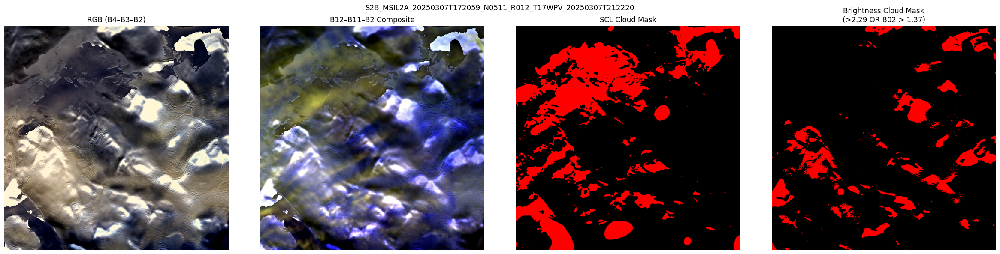

In [ ]:
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"

tile_ids = [
    "S2B_MSIL2A_20250307T172059_N0511_R012_T17WPV_20250307T212220",
    "S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536",
    "S2B_MSIL2A_20250402T173859_N0511_R098_T18XVF_20250402T213551",
    # Add more...
]

for tid in tile_ids:
    plot_tile_panel(tid, val_dir)
    break  # remove break to move to next tile when ready

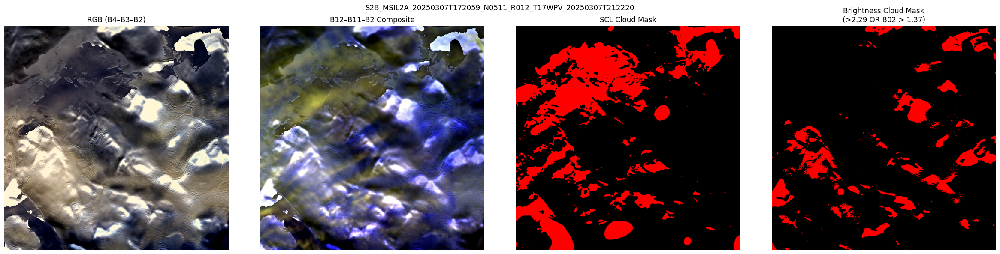

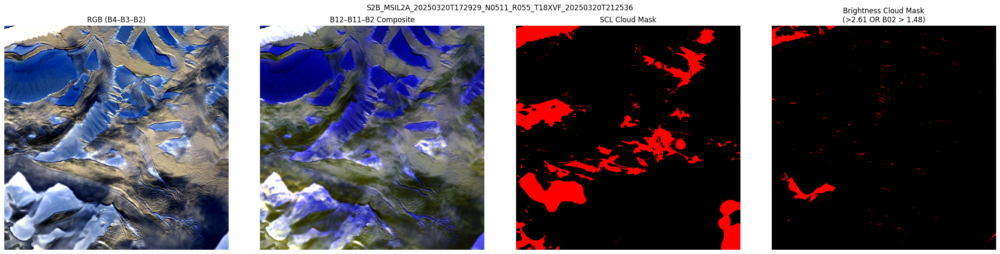

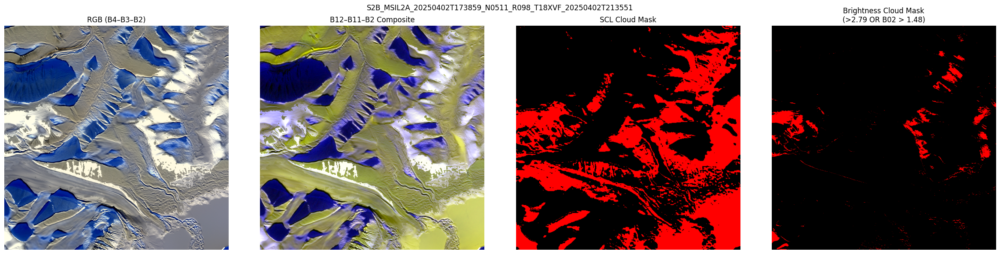

In [ ]:
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"

tile_ids = [
    "S2B_MSIL2A_20250307T172059_N0511_R012_T17WPV_20250307T212220",
    "S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536",
    "S2B_MSIL2A_20250402T173859_N0511_R098_T18XVF_20250402T213551",
    # Add more...
]

for tid in tile_ids:
    plot_tile_panel(tid, val_dir)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap

def detect_clouds_composite_rule(tile_id, val_dir):
    try:
        scl = np.load(f"{val_dir}/{tile_id}_scl.npy")
        features = np.load(f"{val_dir}/{tile_id}_features.npy") / 10000.0

        B02 = features[..., 0]
        B03 = features[..., 1]
        B04 = features[..., 2]
        B08 = features[..., 3]
        B11 = features[..., 4]
        B12 = features[..., 5]

        # Composite-based rules
        bright_white = (B02 > 0.9) & (B11 > 0.9) & (B12 > 0.9)
        yellow_clouds = (B12 > 1.0) & (B11 > 0.9) & (B02 > 0.6) & (B02 < 0.9)
        blue_haze = (B02 > 0.85) & (B11 + B12 < 1.6)
        high_brightness = (B02 + B08 - B11) > 0.95

        cloud_mask = (bright_white | yellow_clouds | blue_haze | high_brightness).astype(np.uint8)

        # Crop center
        H, W = scl.shape
        crop = slice(H//2 - 512, H//2 + 512), slice(W//2 - 512, W//2 + 512)

        scl_crop = scl[crop]
        cloud_crop = cloud_mask[crop]

        scl_mask = np.isin(scl_crop, [8, 9, 10]).astype(np.uint8)

        # RGB and composite visualizations
        rgb = features[..., [3,2,0]][crop]  # B4-B3-B2
        rgb = np.clip((rgb - np.percentile(rgb, 2)) / (np.percentile(rgb, 98) - np.percentile(rgb, 2)), 0, 1)

        B02_c = B02[crop]
        B11_c = B11[crop]
        B12_c = B12[crop]
        composite = np.stack([
            np.clip((B12_c - np.percentile(B12_c, 2)) / (np.percentile(B12_c, 98) - np.percentile(B12_c, 2)), 0, 1),
            np.clip((B11_c - np.percentile(B11_c, 2)) / (np.percentile(B11_c, 98) - np.percentile(B11_c, 2)), 0, 1),
            np.clip((B02_c - np.percentile(B02_c, 2)) / (np.percentile(B02_c, 98) - np.percentile(B02_c, 2)), 0, 1),
        ], axis=-1)

        # Plot
        fig, axs = plt.subplots(1, 4, figsize=(24, 6))
        axs[0].imshow(rgb); axs[0].set_title("RGB (B4–B3–B2)")
        axs[1].imshow(composite); axs[1].set_title("B12–B11–B02 Composite")
        axs[2].imshow(scl_mask, cmap=ListedColormap(['black', 'red'])); axs[2].set_title("SCL Cloud Mask")
        axs[3].imshow(cloud_crop, cmap=ListedColormap(['black', 'red'])); axs[3].set_title("Rule-Based Composite Cloud Mask")
        for ax in axs: ax.axis('off')
        plt.suptitle(tile_id, fontsize=11)
        plt.tight_layout()
        plt.show()

        return cloud_mask  # Optional: return full mask if needed

    except Exception as e:
        print(f"⚠️ Error loading {tile_id}: {e}")

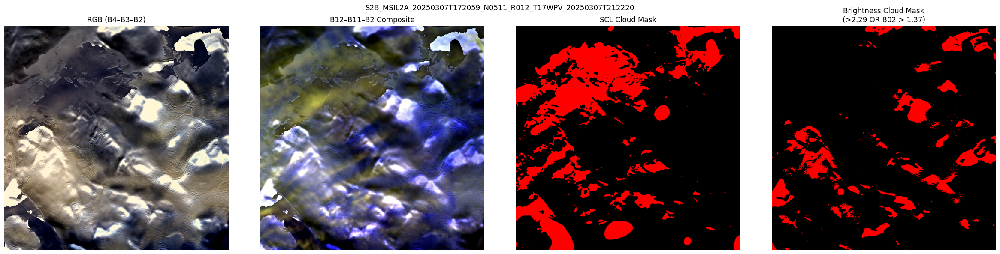

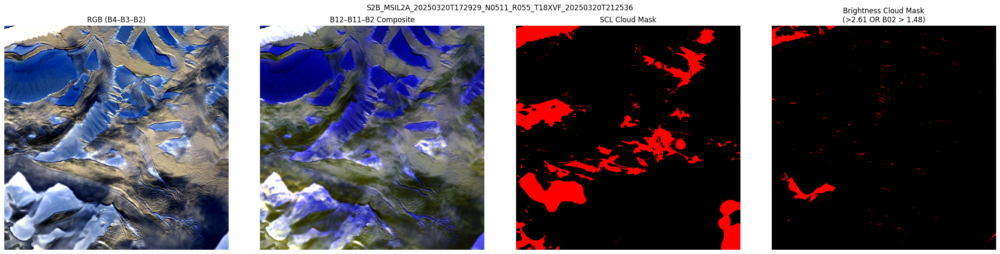

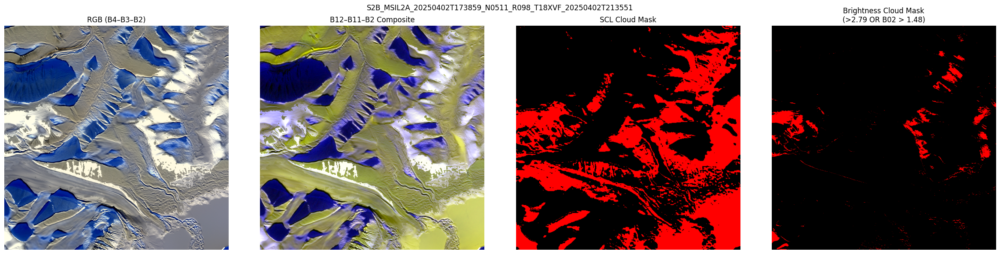

In [ ]:
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"

tile_ids = [
    "S2B_MSIL2A_20250307T172059_N0511_R012_T17WPV_20250307T212220",
    "S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536",
    "S2B_MSIL2A_20250402T173859_N0511_R098_T18XVF_20250402T213551",
    # Add more...
]

for tid in tile_ids:
    plot_tile_panel(tid, val_dir)

In [ ]:
import numpy as np
import os
from glob import glob
from tqdm import tqdm

# === Set up paths
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"
feature_files = sorted(glob(os.path.join(val_dir, "*_features.npy")))
threshold = 0.95
B02 = features[..., 0]
cloud_mask = ((brightness > threshold) | (B02 > 0.9)).astype(np.uint8) * 8  # 8 = cloud

for feat_path in tqdm(feature_files):
    tile_id = os.path.basename(feat_path).replace("_features.npy", "")
    save_path = os.path.join(val_dir, f"{tile_id}_brightness_cloudmask.npy")

    if os.path.exists(save_path):
        print(f"✅ Already exists: {tile_id}")
        continue

    try:
        # Load and compute brightness
        features = np.load(feat_path) / 10000.0
        B04 = features[..., 3]
        B08 = features[..., 4]
        B11 = features[..., 5]
        brightness = B04 + B08 - B11

        # Apply threshold
        cloud_mask = (brightness > threshold).astype(np.uint8) * 8  # SCL-like class 8 = cloud

        # Save
        np.save(save_path, cloud_mask)
        print(f"✅ Saved: {tile_id}_brightness_cloudmask.npy")

        del features, B04, B08, B11, brightness, cloud_mask  # free memory

    except Exception as e:
        print(f"❌ Error with {tile_id}: {e}")

  8%|▊         | 1/12 [00:15<02:51, 15.62s/it]

✅ Saved: S2B_MSIL2A_20250307T172059_N0511_R012_T17WPV_20250307T212220_brightness_cloudmask.npy


 17%|█▋        | 2/12 [00:31<02:34, 15.48s/it]

✅ Saved: S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536_brightness_cloudmask.npy


 25%|██▌       | 3/12 [00:56<03:01, 20.12s/it]

✅ Saved: S2B_MSIL2A_20250402T173859_N0511_R098_T18XVF_20250402T213551_brightness_cloudmask.npy


 33%|███▎      | 4/12 [01:29<03:21, 25.22s/it]

✅ Saved: S2B_MSIL2A_20250426T171859_N0511_R012_T17WNV_20250426T193609_brightness_cloudmask.npy


 42%|████▏     | 5/12 [01:59<03:08, 26.98s/it]

✅ Saved: S2B_MSIL2A_20250512T173909_N0511_R098_T18XVF_20250512T212716_brightness_cloudmask.npy


 50%|█████     | 6/12 [02:20<02:29, 24.91s/it]

✅ Saved: S2B_MSIL2A_20250515T174909_N0511_R141_T18XVF_20250515T214436_brightness_cloudmask.npy


 58%|█████▊    | 7/12 [02:45<02:04, 24.89s/it]

✅ Saved: S2B_MSIL2A_20250605T171859_N0511_R012_T18XVG_20250605T204239_brightness_cloudmask.npy


 67%|██████▋   | 8/12 [03:14<01:44, 26.15s/it]

✅ Saved: S2C_MSIL2A_20250311T175201_N0511_R141_T17WNV_20250311T215511_brightness_cloudmask.npy


 75%|███████▌  | 9/12 [03:39<01:17, 25.71s/it]

✅ Saved: S2C_MSIL2A_20250322T172031_N0511_R012_T17WPV_20250322T225314_brightness_cloudmask.npy


 83%|████████▎ | 10/12 [04:02<00:49, 24.93s/it]

✅ Saved: S2C_MSIL2A_20250322T172031_N0511_R012_T17XNA_20250322T225314_brightness_cloudmask.npy


 92%|█████████▏| 11/12 [04:26<00:24, 24.64s/it]

✅ Saved: S2C_MSIL2A_20250508T170911_N0511_R112_T18XVF_20250508T214011_brightness_cloudmask.npy


100%|██████████| 12/12 [04:46<00:00, 23.88s/it]

✅ Saved: S2C_MSIL2A_20250616T173921_N0511_R098_T17XNA_20250616T205314_brightness_cloudmask.npy


In [ ]:
import numpy as np
import os

# === Define tile and paths
tile_id = "S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536"
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"

scl = np.load(f"{val_dir}/{tile_id}_scl.npy")
brightness_mask = np.load(f"{val_dir}/{tile_id}_brightness_cloudmask.npy")

# === Replace SCL class 11 with 8 only where brightness also says cloud
enhanced_scl = np.where((scl == 11) & (brightness_mask == 8), 8, scl)

# === Save enhanced SCL
np.save(f"{val_dir}/{tile_id}_scl_cleaned.npy", enhanced_scl)
print(f"✅ Saved enhanced SCL: {tile_id}_scl_cleaned.npy")

✅ Saved enhanced SCL: S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536_scl_cleaned.npy


In [ ]:
import numpy as np
import json
from sklearn.metrics import classification_report, accuracy_score

# === Load manual labels
with open("/content/drive/MyDrive/Sentinel2_PondInlet_Exports/manual_labels_corrected.json") as f:
    manual = json.load(f)
manual = {int(k): int(v) for k, v in manual.items()}

# === Load patch labels
y_scl = np.load("/content/drive/MyDrive/Sentinel2_PondInlet_Exports/y_labels_L2A.npy")           # original SCL
y_clean = np.load("/content/drive/MyDrive/Sentinel2_PondInlet_Exports/y_labels_cleaned.npy")     # enhanced SCL

# === Filter to only manually labeled indices
idxs = [i for i in manual if i < len(y_clean)]
y_true = np.array([manual[i] for i in idxs])
y_pred_clean = np.array([y_clean[i] for i in idxs])
y_pred_scl = np.array([y_scl[i] for i in idxs])

# === Evaluation
print("📊 Original SCL vs Manual Labels:")
print(classification_report(y_true, y_pred_scl))
print("✅ Accuracy:", accuracy_score(y_true, y_pred_scl))

print("\n📊 Enhanced SCL (brightness-cleaned) vs Manual Labels:")
print(classification_report(y_true, y_pred_clean))
print("✅ Accuracy:", accuracy_score(y_true, y_pred_clean))

📊 Original SCL vs Manual Labels:
              precision    recall  f1-score   support

           8       0.04      0.31      0.08        61
           9       0.00      0.00      0.00         0
          10       0.00      0.00      0.00         0
          11       0.99      0.89      0.94      6147

    accuracy                           0.89      6208
   macro avg       0.26      0.30      0.25      6208
weighted avg       0.98      0.89      0.93      6208

✅ Accuracy: 0.889014175257732

📊 Enhanced SCL (brightness-cleaned) vs Manual Labels:
              precision    recall  f1-score   support

           2       0.00      0.00      0.00         0
           5       0.00      0.00      0.00         0
           8       0.00      0.13      0.01        61
          10       0.00      0.00      0.00         0
          11       0.99      0.59      0.74      6147

    accuracy                           0.59      6208
   macro avg       0.20      0.14      0.15      6208
weighted avg 

/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.p

In [ ]:
import numpy as np
from collections import Counter

tile_id = "S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536"
val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"

scl = np.load(f"{val_dir}/{tile_id}_scl.npy")
scl_cleaned = np.load(f"{val_dir}/{tile_id}_scl_cleaned.npy")

# === Count total pixel changes
mask_diff = scl != scl_cleaned
changed = np.sum(mask_diff)
total = scl.size
print(f"🧮 Pixels changed: {changed:,} / {total:,} ({100*changed/total:.2f}%)")

# === Count class changes (especially cloud ↔ snow)
diff_indices = np.where(mask_diff)
orig_vals = scl[diff_indices]
new_vals = scl_cleaned[diff_indices]

change_counts = Counter((int(o), int(n)) for o, n in zip(orig_vals, new_vals))

print("\n🔁 Class Change Breakdown (original → cleaned):")
for (old, new), count in sorted(change_counts.items()):
    print(f"  {old} → {new}: {count:,} px")

🧮 Pixels changed: 24,508,358 / 120,560,400 (20.33%)

🔁 Class Change Breakdown (original → cleaned):
  11 → 8: 24,508,358 px


In [ ]:
import numpy as np
import os
from glob import glob
from tqdm import tqdm

val_dir = "/content/drive/MyDrive/Sentinel2_PondInlet_Exports/Processed_NPY_Validation"
scl_files = sorted(glob(os.path.join(val_dir, "*_scl.npy")))

results = []

for scl_path in tqdm(scl_files):
    tile_id = os.path.basename(scl_path).replace("_scl.npy", "")
    clean_path = os.path.join(val_dir, f"{tile_id}_scl_cleaned.npy")

    if not os.path.exists(clean_path):
        continue

    scl = np.load(scl_path)
    cleaned = np.load(clean_path)

    total_px = scl.size
    cloud_orig = np.isin(scl, [8, 9, 10]).sum()
    cloud_cleaned = np.isin(cleaned, [8, 9, 10]).sum()

    changed = ((scl == 11) & (cleaned == 8)).sum()
    cri = 100 * (cloud_orig - cloud_cleaned) / cloud_orig if cloud_orig > 0 else 0

    results.append((tile_id, cloud_orig, cloud_cleaned, changed, cri))

# === Display results
print("🔍 Tile-by-tile cloud pixel counts:\n")
total_change = 0
for tile_id, c0, c1, changed, cri in results:
    print(f"{tile_id} | Original: {c0:,} | Cleaned: {c1:,} | CRI: {cri:.2f}%")
    total_change += changed

# === Global CRI
cloud0 = sum(r[1] for r in results)
cloud1 = sum(r[2] for r in results)
global_cri = 100 * (cloud0 - cloud1) / cloud0 if cloud0 > 0 else 0

print(f"\n✅ Global CRI across {len(results)} tiles = {global_cri:.2f}% reduction in cloud masking")

100%|██████████| 12/12 [00:53<00:00,  4.48s/it]

🔍 Tile-by-tile cloud pixel counts:

S2B_MSIL2A_20250307T172059_N0511_R012_T17WPV_20250307T212220 | Original: 63,940,452 | Cleaned: 46,891,691 | CRI: 26.66%
S2B_MSIL2A_20250320T172929_N0511_R055_T18XVF_20250320T212536 | Original: 57,090,824 | Cleaned: 81,599,182 | CRI: -42.93%
S2B_MSIL2A_20250402T173859_N0511_R098_T18XVF_20250402T213551 | Original: 25,749,480 | Cleaned: 926,571 | CRI: 96.40%
S2B_MSIL2A_20250426T171859_N0511_R012_T17WNV_20250426T193609 | Original: 11,960,668 | Cleaned: 63,652 | CRI: 99.47%
S2B_MSIL2A_20250512T173909_N0511_R098_T18XVF_20250512T212716 | Original: 32,267,388 | Cleaned: 10,404,143 | CRI: 67.76%
S2B_MSIL2A_20250515T174909_N0511_R141_T18XVF_20250515T214436 | Original: 17,002,728 | Cleaned: 4,186,405 | CRI: 75.38%
S2B_MSIL2A_20250605T171859_N0511_R012_T18XVG_20250605T204239 | Original: 2,667,812 | Cleaned: 1,819,369 | CRI: 31.80%
S2C_MSIL2A_20250311T175201_N0511_R141_T17WNV_20250311T215511 | Original: 38,252,484 | Cleaned: 27,822,326 | CRI: 27.27%
S2C_MSIL2A_20